In [1]:
import os, sys, cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import laspy
from tqdm.notebook import tqdm
from numba import jit, njit, prange
from glob import glob
import TronLasPy as tl
import TronGisPy as tgp

def cv2_imshow(a, **kwargs):
    a = a.clip(0, 255).astype('uint8')
    # cv2 stores colors as BGR; convert to RGB
    if a.ndim == 3:
        if a.shape[2] == 4:
            a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
        else:
            a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    return plt.imshow(a, **kwargs)

plt.rcParams["figure.figsize"] = (20,20)

In [182]:
# def PCA(data, correlation = False, sort = True):
#     mean = np.mean(data, axis=0)
#     data_adjust = data - mean
#     #: the data is transposed due to np.cov/corrcoef syntax
#     if correlation:
#         matrix = np.corrcoef(data_adjust.T)
#     else:
#         matrix = np.cov(data_adjust.T) 
#     eigenvalues, eigenvectors = np.linalg.eig(matrix)
#     if sort:
#         #: sort eigenvalues and eigenvectors
#         sort = eigenvalues.argsort()[::-1]
#         eigenvalues = eigenvalues[sort]
#         eigenvectors = eigenvectors[:,sort]
#     return eigenvalues, eigenvectors
# def best_fitting_plane(points, equation=False):
#     w, v = PCA(points)
#     #: the normal of the plane is the last eigenvector
#     normal = v[:,2]
#     #: get a point from the plane
#     point = np.mean(points, axis=0)
#     if equation:
#         a, b, c = normal
#         d = -(np.dot(normal, point))
#         return a, b, c, d
#     else:
#         return point, normal  # 向量上一點和法向量

In [2]:
fpFolder = r"P:/HDmap/Open_Field/LiDAR/QinPu/step001_ground_filter/"
fileName = "桃園青埔_6379450200000H.las"
cpG = tl.read_las(os.path.join(fpFolder, "ground", fileName))

In [ ]:
def coplanar_area(points, plane_normal=None):

    if not plane_normal:

        #  p, normal = plane_def_by(points[:3])
        pass

    else:
        #  normal = normalize(plane_normal)
        pass

    #: get an array with the first point positioned as last
    points_rolled = np.roll(points, len(points) - 1, axis=0)

    cross_product = np.cross(points, points_rolled)

    summed = np.sum(cross_product, axis=0)

    total = np.dot(summed, plane_normal)

    area = 0.5 * abs(total)

    return area


In [7]:
from scipy.spatial import cKDTree

class KDTree(cKDTree):
    def __init__(self, points, leafsize=16, compact_nodes=False, balanced_tree=False):
        self._points = points
        self._leafsize = leafsize
        self._compact_nodes = compact_nodes
        self._balanced_tree = balanced_tree

    def compute(self):
        self.id = "K({},{},{})".format(self._leafsize, self._compact_nodes, self._balanced_tree)
        cKDTree.__init__(
            self,
            self._points,
            leafsize=self._leafsize,
            compact_nodes=self._compact_nodes,
            balanced_tree=self._balanced_tree)
        
def neighbors_by_K(kdtree, k):
    """ Get indices of K neartest neighbors for each point
    Parameters
    ----------
    kdtree: pyntcloud.structrues.KDTree
        The KDTree built on top of the points in point cloud
    k: int
        Number of neighbors to find
    Returns
    -------
    k_neighbors: (N, k) array
        Where N = kdtree.data.shape[0]
    """
    # [1] to select indices and ignore distances
    # [:,1:] to discard self-neighbor
    return kdtree.query(kdtree.data, k=k + 1, n_jobs=-1)[1][:, 1:]



def neighbors_by_radius(kdtree, r):
    """ Get indices of all neartest neighbors with a distance < r for each point
    Parameters
    ----------
    kdtree: pyntcloud.structrues.KDTree
        The KDTree built on top of the points in point cloud
    r: float
        Maximum distance to consider a neighbor
    Returns
    -------
    r_neighbors: (N, X) ndarray of lists
        Where N = kdtree.data.shape[0]
        len(X) varies for each point
    """
    return np.array(kdtree.query_ball_tree(kdtree, r))

In [9]:
%%time
kdt = KDTree(cpG.data[:,:3])
kdtree_compute = kdt.compute()
#vector, i = kdt.query(self.voxel_centers, n_jobs=-1)

Wall time: 18.4 s


In [ ]:
%%time
neighbors_by_radius(kdt, 0.5)

In [189]:
cpG.data[:,:3]

array([[2.71829930e+05, 2.76837090e+06, 9.00800000e+01],
       [2.71829970e+05, 2.76837089e+06, 9.00900000e+01],
       [2.71830090e+05, 2.76837082e+06, 9.01300000e+01],
       ...,
       [2.71901180e+05, 2.76843697e+06, 8.79900000e+01],
       [2.71901590e+05, 2.76843663e+06, 8.80100000e+01],
       [2.71901540e+05, 2.76843664e+06, 8.80100000e+01]])

In [204]:
%%time
csf = CSF.CSF()

# prameter settings
# csf.params.bSloopSmooth = True
# csf.params.cloth_resolution = 0.1

csf.params.bSloopSmooth = False;
csf.params.cloth_resolution = 0.5;
csf.params.rigidness = 3;

csf.params.time_step = 0.65;
csf.params.class_threshold = 0.5;
csf.params.interations = 500;
# more details about parameter: http://ramm.bnu.edu.cn/projects/CSF/download/

csf.setPointCloud(cpG.data[:,:3])
ground = CSF.VecInt()  # a list to indicate the index of ground points after calculation
non_ground = CSF.VecInt() # a list to indicate the index of non-ground points after calculation
csf.do_filtering(ground, non_ground) # do actual filtering.
print("Filtering Done!")

Filtering Done!
Wall time: 4min 7s


In [202]:
cpG.data.shape

(132129148, 10)

In [205]:
%%time
cpG.data[ground].shape

Wall time: 1min 48s


(130472338, 10)

In [207]:
%%time
inFile = laspy.file.File(os.path.join(fpFolder, "ground", fileName), mode='r') # read a las file
points = inFile.points
outFile = laspy.file.File("./tmp_results/text2ndCSF_ground2.las", mode='w', header=inFile.header)
outFile.points = points[ground] # extract ground points, and save it to a las file.
outFile.close()
outFile = laspy.file.File("./tmp_results/text2ndCSF_nonground2.las", mode='w', header=inFile.header)
outFile.points = points[non_ground] # extract ground points, and save it to a las file.
outFile.close()
inFile.close()

Wall time: 4min 18s


In [198]:
cpG.data.shape, non_ground[-1]

((132129148, 10), 132072583)

In [186]:
%%time
fittingPlane = best_fitting_plane(cpG.data[:,:3].)

Wall time: 5.42 s


In [188]:
fittingPlane

(array([2.71860678e+05, 2.76841393e+06, 8.89262630e+01]),
 array([0.01819576, 0.01008969, 0.99978353]))

In [2]:
raster_cpG_I_mean = np.load("./tmp_results/raster_cpG_I_mean.npy")
raster_cpG_Z_max = np.load("./tmp_results/raster_cpG_Z_max.npy")
raster_cpG_Z_count = np.load("./tmp_results/raster_cpG_Z_count.npy")
raster_cpG_Z_std = np.load("./tmp_results/raster_cpG_Z_std.npy")
raster_cpG_I_count = np.load("./tmp_results/raster_cpG_I_count.npy")
raster_cpNG_Z_max = np.load("./tmp_results/raster_cpNG_Z_max.npy")
raster_cpNG_Z_count = np.load("./tmp_results/raster_cpNG_Z_count.npy")
raster_cpNG_Z_std = np.load("./tmp_results/raster_cpNG_Z_std.npy")

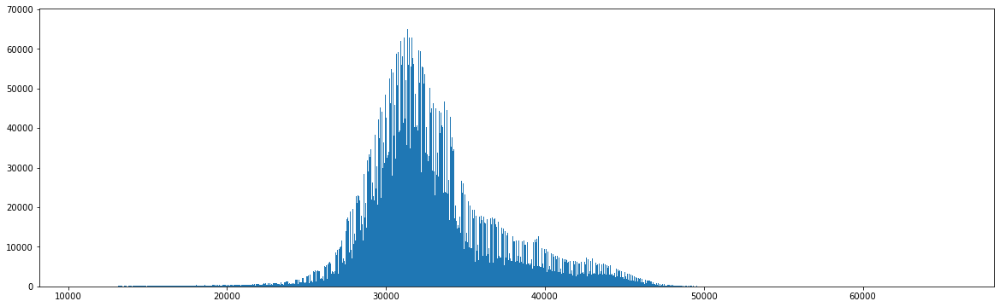

In [3]:
plt.figure(figsize=(20,6))
plt.hist(raster_cpG_I_mean.flatten()[~np.isnan(raster_cpG_I_mean.flatten())], bins=5000);

In [34]:
tmp = raster_cpNG_Z_count.copy()
tmp[np.isnan(tmp)] = 0
tmp = tmp.astype(int)
tmp_value = tmp.flatten()[tmp.flatten()>0]
bincount_tmp = np.bincount(tmp_value.astype(int))
# for i in range(len(bincount_tmp)):
#     print(i, bincount_tmp[i])

In [53]:
np.unique(raster_cpNG_Z_std[~np.isnan(raster_cpNG_Z_std)])

array([0.00000000e+00, 8.16496581e-04, 8.39181358e-04, ...,
       7.89131168e+00, 7.89131168e+00, 7.90545381e+00])

In [56]:
np.unique(norCpNG_Z_std)

array([0.00000000e+00, 3.06430022e-04, 3.14943588e-04, ...,
       9.99988263e-01, 9.99992371e-01, 1.00000000e+00])

array([0, 1])

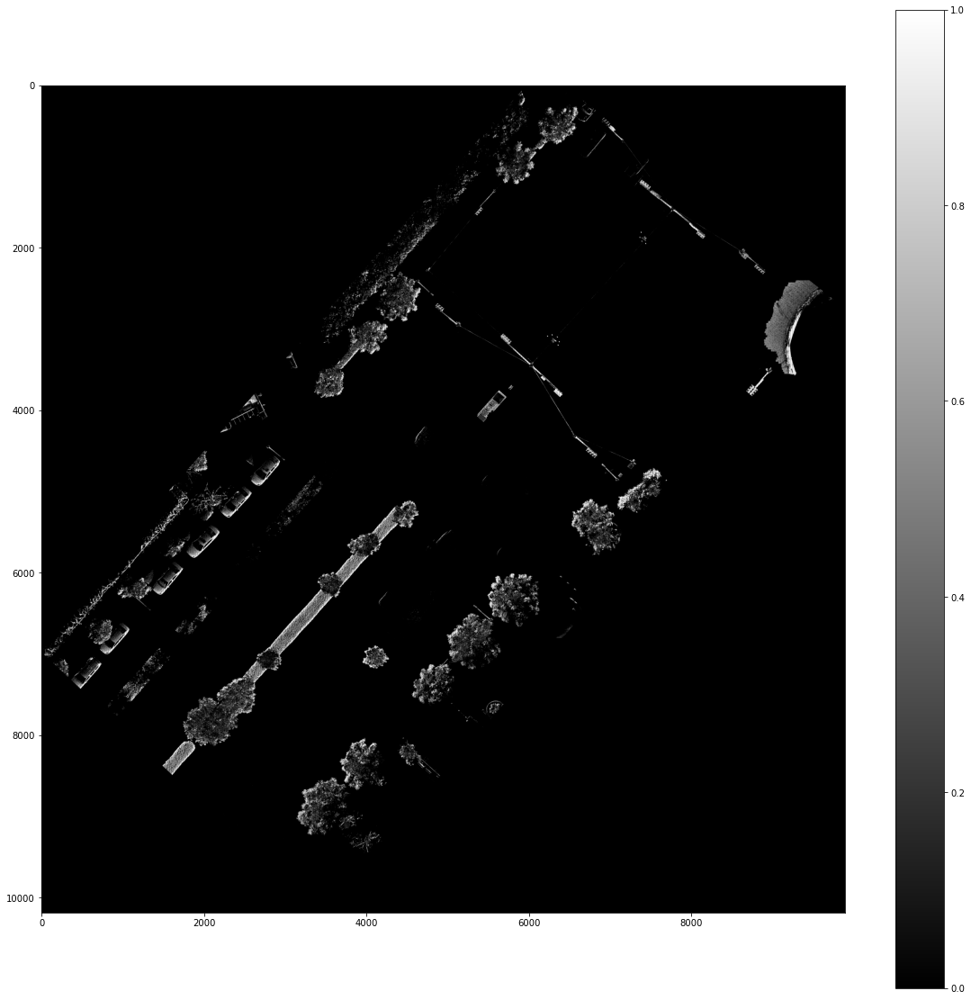

In [73]:
norCpNG_Z_std_bool = (norCpNG_Z_std>0).astype(int)
plt.imshow(norCpNG_Z_std_bool, "gray")
plt.colorbar()
np.unique(norCpNG_Z_std_bool)

(10187, 9894, 1)

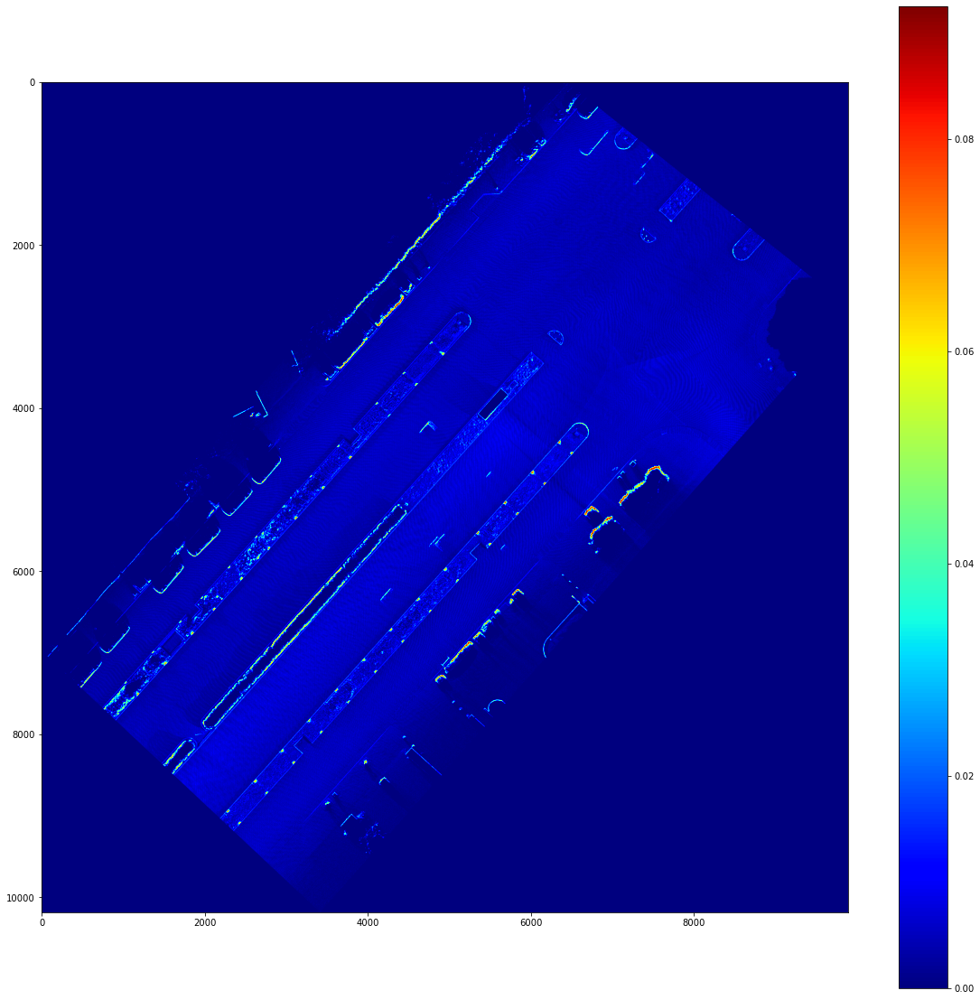

In [152]:
# norCpNG_Z_std = tgp.Normalizer().fit_transform(raster_cpG_I_count, clip_percentage=(0.01, 0.99))
clipNorGround_I_count = tgp.Normalizer().clip_by_percentage(raster_cpG_Z_std, clip_percentage=(0.01, 0.99))
clipNorGround_I_count[np.isnan(clipNorGround_I_count)] = 0
plt.imshow(clipNorGround_I_count, "jet")
plt.colorbar()

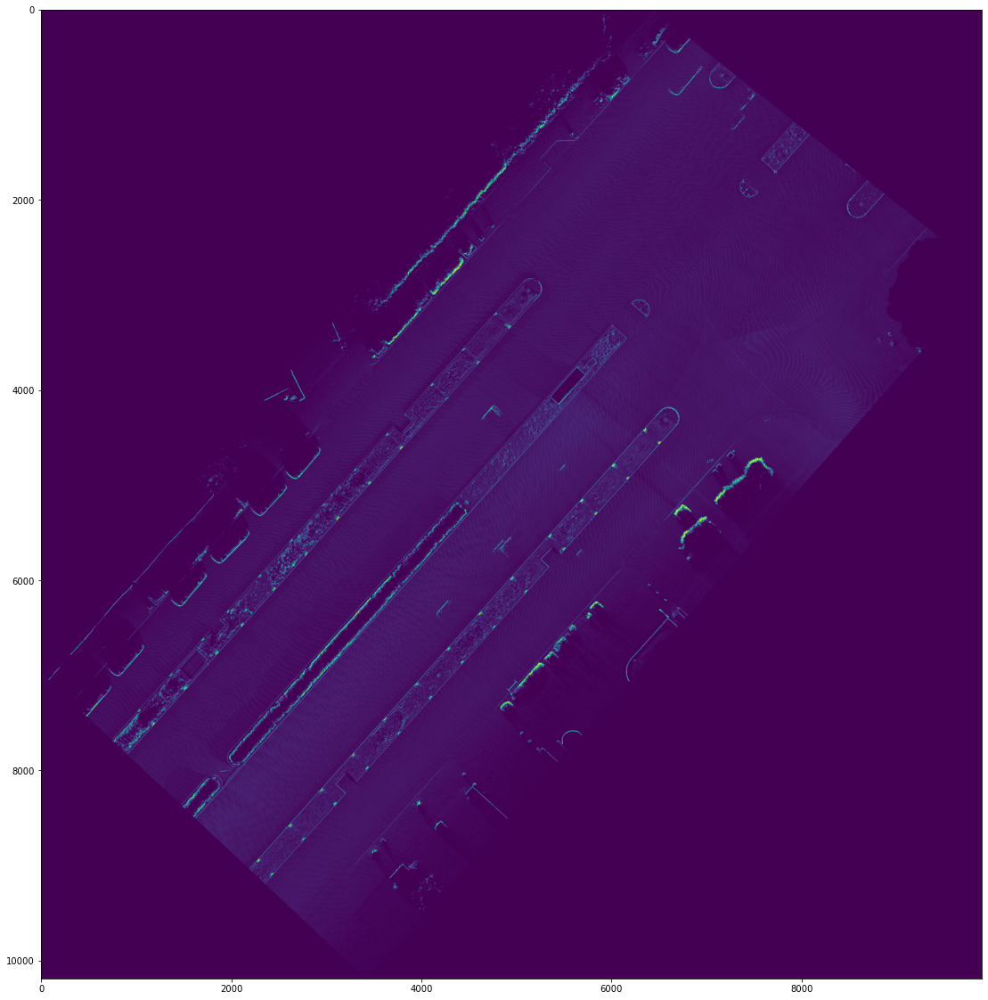

In [168]:
cv2_imshow((clipNorGround_I_count*256/clipNorGround_I_count.max()).astype(int)[...,0])
# clipNorGround_I_count.min(), clipNorGround_I_count.max()

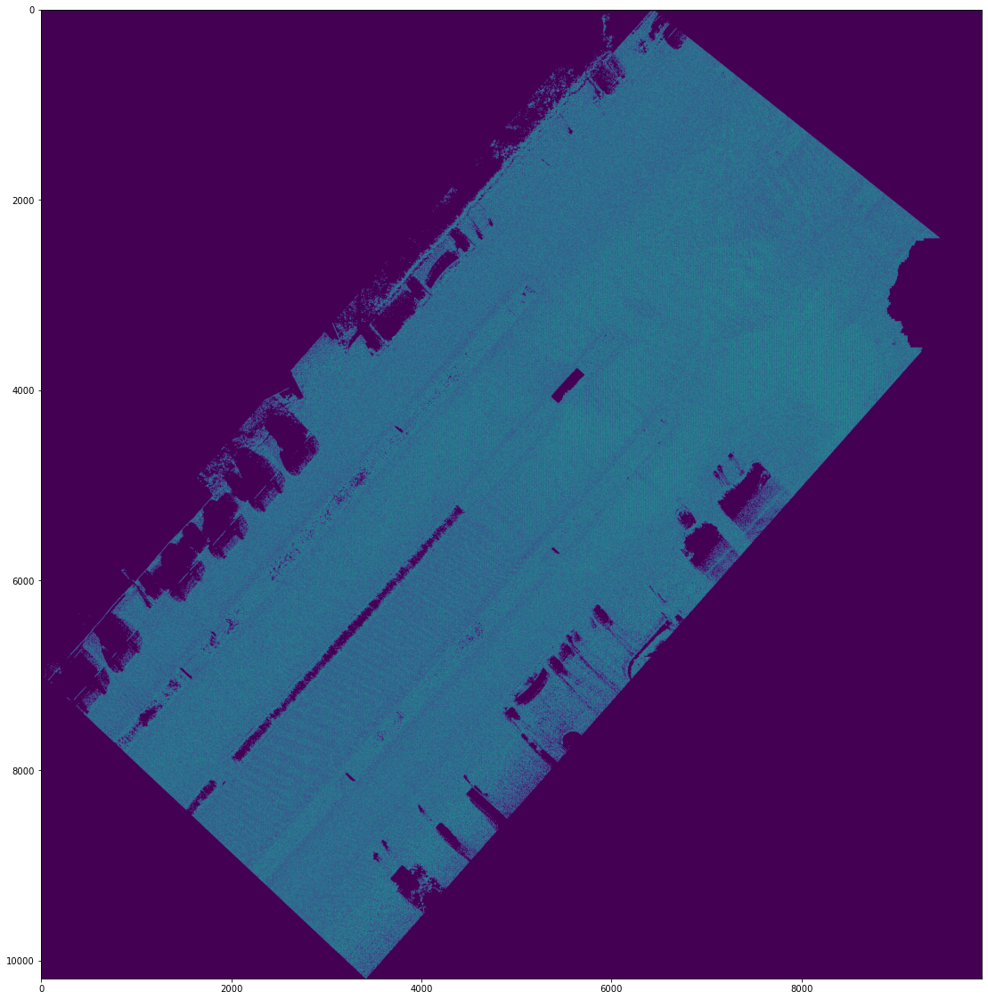

In [181]:
# GaussianBlur_clipNorGround_I_count = cv2.GaussianBlur(clipNorGround_I_count*256/clipNorGround_I_count.max(), (5,5), 1)
# cv2_imshow(GaussianBlur_clipNorGround_I_count)

def otsu_canny(image, lowrate=0.9):
#     if len(image.shape) > 2:
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Otsu's thresholding
    ret, _ = cv2.threshold(image, thresh=0, maxval=10, type=(cv2.THRESH_BINARY + cv2.THRESH_OTSU))
    edged = cv2.Canny(image, threshold1=(ret * lowrate), threshold2=ret)

    # return the edged image
    return edged

otus_I_count = otsu_canny(((clipNorGround_I_count*256/clipNorGround_I_count.max())[...,0]).astype(np.uint8))
cv2_imshow(otus_I_count)

In [167]:
GaussianBlur_clipNorGround_I_count.shape

(10187, 9894)

In [160]:
cv2.imwrite("tmp_results/clipNorGround_I_count.png", clipNorGround_I_count*2766.961287469591)

True

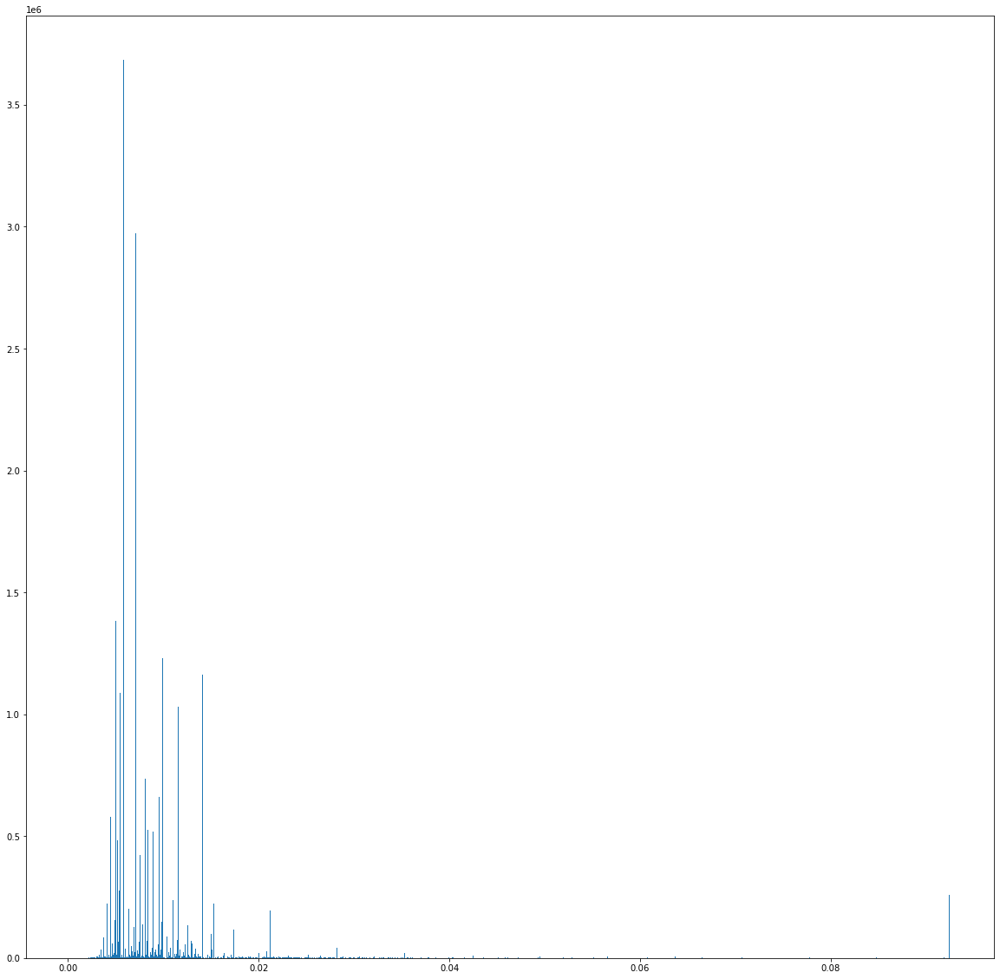

In [149]:
nonZero_clipNorGround_I_count = clipNorGround_I_count.flatten().copy()
plt.hist(nonZero_clipNorGround_I_count[nonZero_clipNorGround_I_count !=0 ], bins=1000);

In [46]:
tmp_canvas = tmp.copy()
ratio = 0.95
print(np.quantile(bincount_tmp,ratio))
# tmp_canvas[tmp_canvas>np.quantile(bincount_tmp,ratio)] = np.quantile(bincount_tmp,ratio)
# plt.imshow(tmp_canvas, "gray")

1.0


In [9]:
np.bincount(tmp_value.astype(int))

array([      0, 6673592, 6624285, ...,       0,       0,       1],
      dtype=int64)

In [6]:
# # define constants for Hough Transform
# rho = 3  # distance resolution in pixels of the Hough grid
# theta = np.pi / 180  # angular resolution of the Hough grid
# threshold = 30  # minimum number of votes 
# min_line_length = 10  # minimum number of pixels making up a line
# max_line_gap = 10  # maximum gap in pixels between connectable line segments


# # Run Hough on edges
# # Output "lines" is an array containing endpoints of detected line segments
# lines = cv2.HoughLinesP(edges, rho, theta, threshold, np.array([]),
#                     min_line_length, max_line_gap)

65536

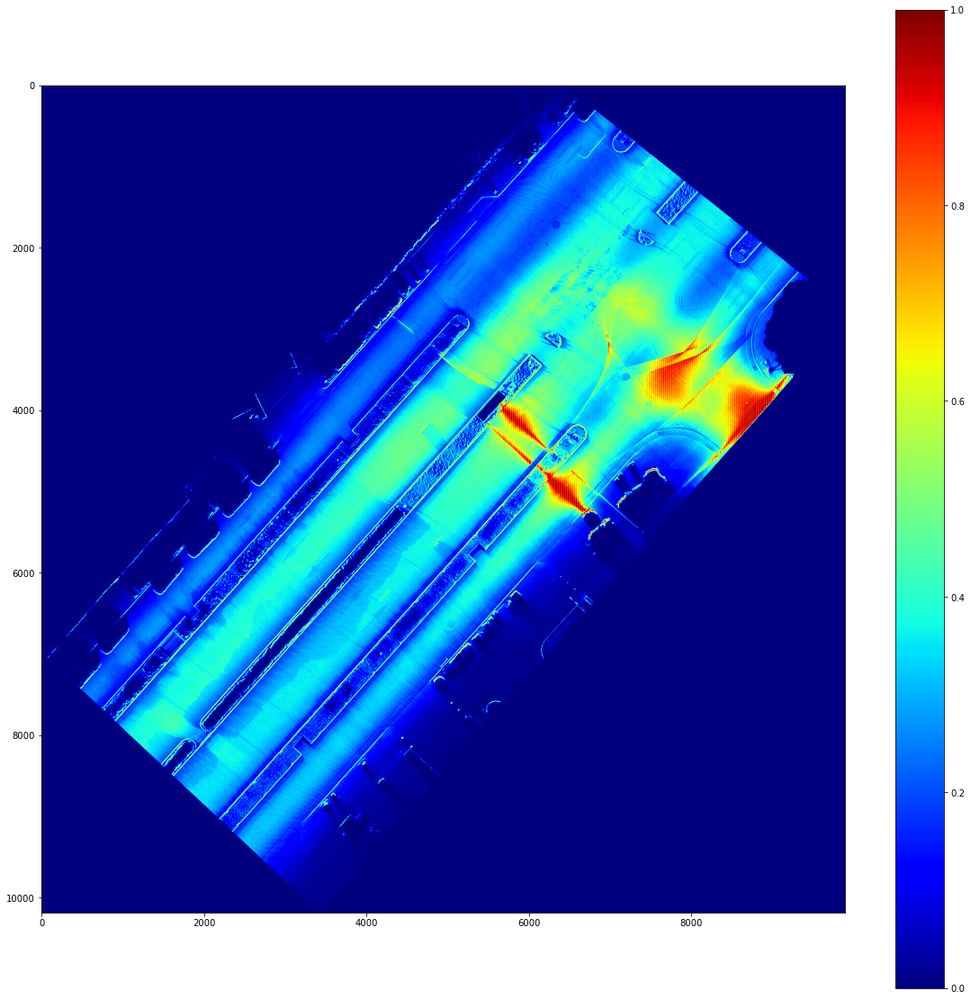

In [16]:
clipCount = tgp.Normalizer().fit_transform(raster_cpG_Z_count, clip_percentage=(0.05, 0.95))
clipCount[np.isnan(clipCount)] = 0
plt.imshow(clipCount, "jet")
plt.colorbar()

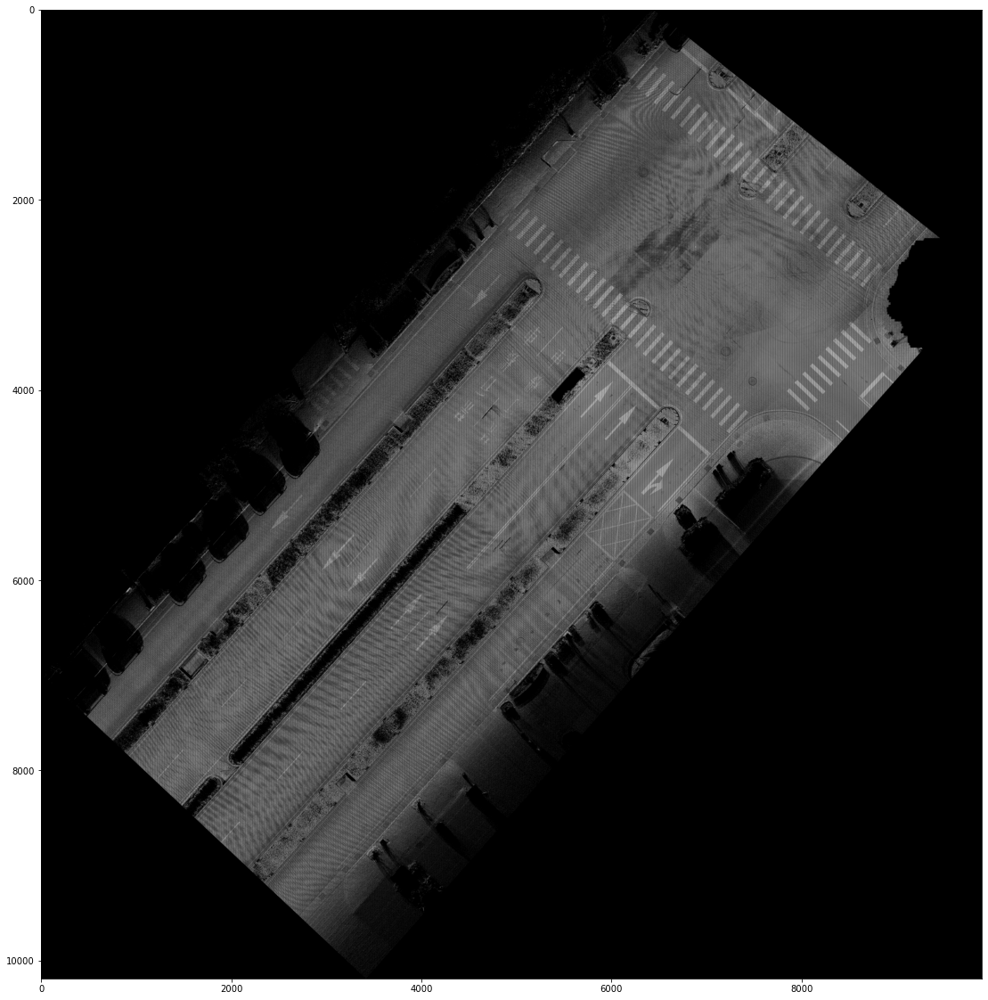

In [13]:
# cv2_imshow(raster_Z_std[:]*256)
# raster_Z_std<1
# filterMask = ( (raster_Z_std[6800:7200, 3800:4200] < 1)).astype(int)
filterMask = ((0.00899574599228118-0.017586082276113364 <raster_cpG_Z_std ) * (raster_cpG_Z_std < 0.00899574599228118+0.017586082276113364)).astype(int)
# plt.rcParams["figure.figsize"] = (20,20)
cv2_imshow( (filterMask*raster_cpG_I_mean/256));

In [113]:
# np.unique(norCpNG_Z_std_bool[~np.isnan(norCpNG_Z_std_bool)])
tmp_std = norCpNG_Z_std_bool*\
           (np.isnan(norCpNG_Z_std_bool)).astype(float)*\
           (norCpNG_Z_std_bool<np.nanquantile(norCpNG_Z_std_bool,.99)).astype(float)*\
           (norCpNG_Z_std_bool>np.nanquantile(norCpNG_Z_std_bool,.01)).astype(float)
# plt.imshow()

In [127]:
np.unique(tmp_std)

array([0.        , 0.00023162, 0.00023181, ...,        nan,        nan,
              nan])

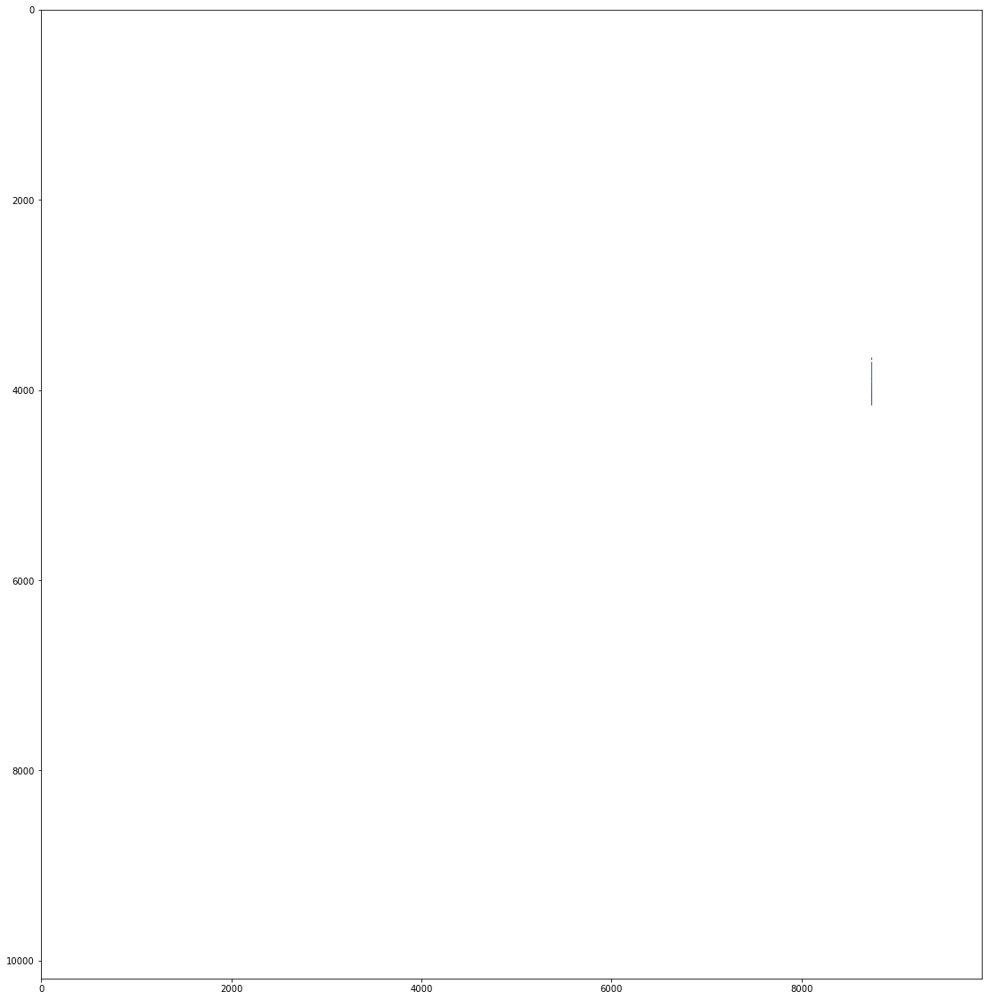

In [138]:
# normalizer = tgp.Normalizer()
# tmp_std = normalizer.fit_transform(raster_cpG_Z_std, clip_percentage=(0.1, 0.9))
plt.imshow(tmp_std)

In [95]:
norCpNG_Z_std_bool = raster_cpG_Z_std.copy()
# norCpNG_Z_std_bool[norCpNG_Z_std_bool>np.nanmean(norCpNG_Z_std_bool)] = 0
# plt.imshow(norCpNG_Z_std_bool, "jet", vmax=1e-9)
# plt.colorbar()

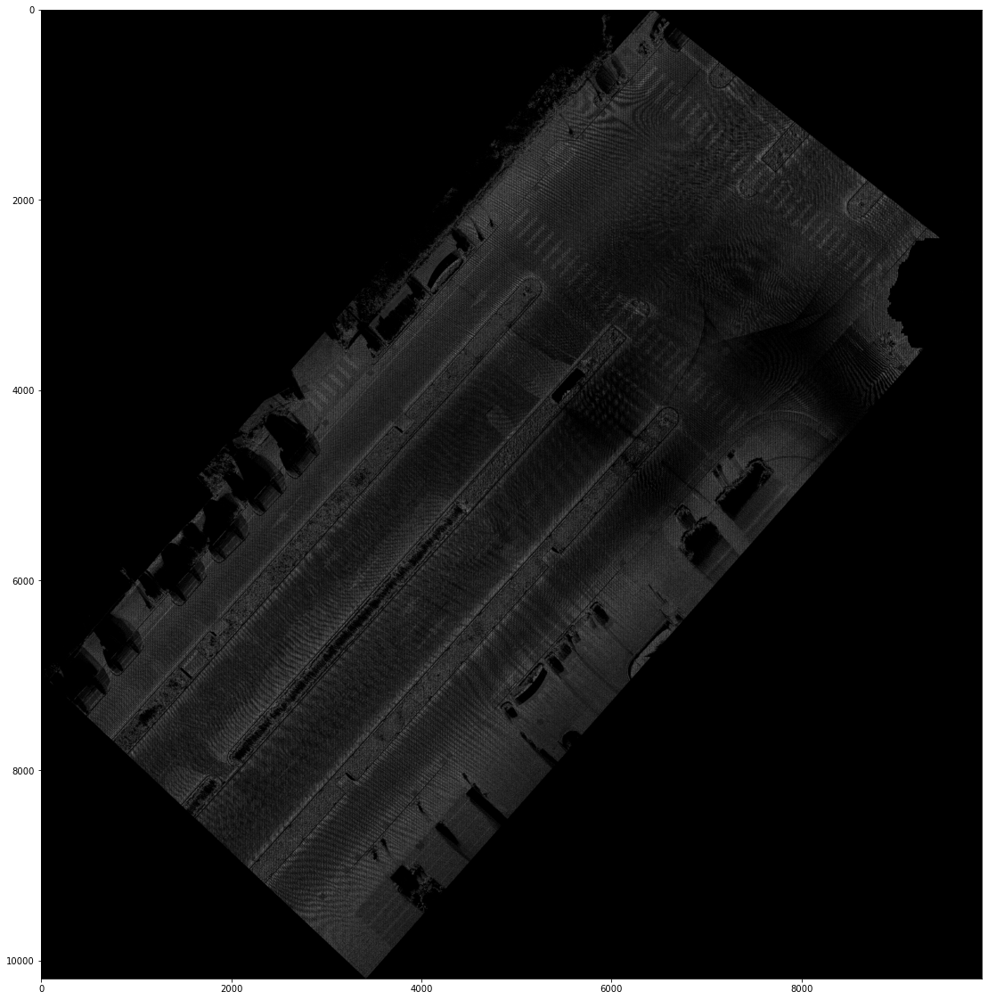

In [82]:
# cv2_imshow(raster_Z_std[:]*256)
# raster_Z_std<1
# filterMask = ( (raster_Z_std[6800:7200, 3800:4200] < 1)).astype(int)
# norCpNG_Z_std_bool = (raster_cpNG_Z_std>0).astype(int)
# plt.imshow(norCpNG_Z_std_bool, "gray")
# plt.colorbar()
# np.unique(norCpNG_Z_std_bool)
filterMask = ((raster_cpG_I_mean > 140 * 256) * (norCpNG_Z_std_bool == 0)).astype(int)
# plt.rcParams["figure.figsize"] = (20,20)
cv2_imshow( (filterMask*raster_cpG_I_mean/256));

True

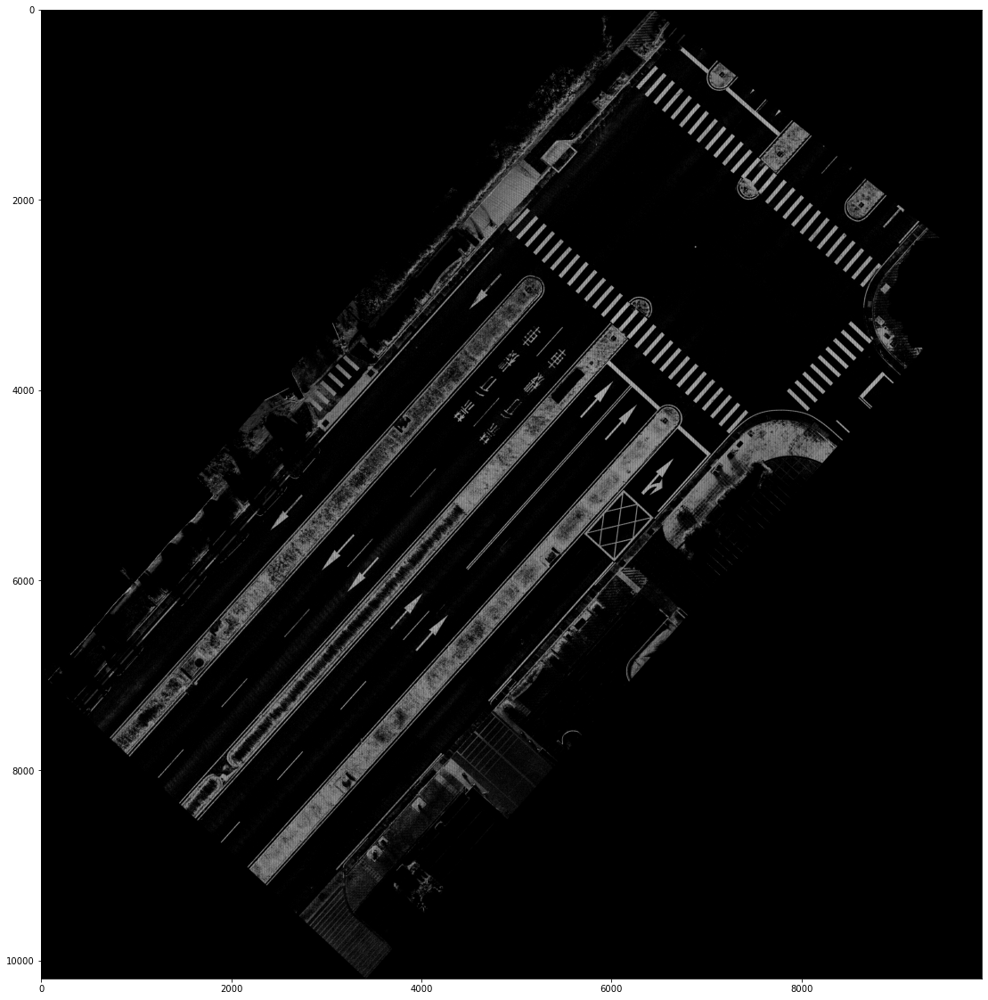

In [29]:
# filterMask = (raster_I > np.nanquantile(raster_I, 0.85)).astype(int)
filterMask = (raster_I > 140*256).astype(int)
cv2_imshow( filterMask*raster_I/256)
cv2.imwrite("tmp_results/raster_I_filter.png",  filterMask*raster_I/256)

In [39]:
# #invert image
# image = (filterMask*raster_I/256).copy()
# invImg = np.full(image.shape, np.nanmax(image)) - image

# #Scale and convert to integer
# scale = 255 / (np.floor( np.nanmax(invImg)) - np.floor( np.nanmin(invImg)))
# imgScaled = (invImg - np.nanmin(invImg)) * scale

# imgInt= np.uint8(image)

# edges = cv2.Canny(imgInt, 50,220)
# # define constants for Hough Transform
# rho = 3  # distance resolution in pixels of the Hough grid
# theta = np.pi / 180  # angular resolution of the Hough grid
# threshold = 30  # minimum number of votes 
# min_line_length = 10  # minimum number of pixels making up a line
# max_line_gap = 10  # maximum gap in pixels between connectable line segments


# # Run Hough on edges
# # Output "lines" is an array containing endpoints of detected line segments
# lines = cv2.HoughLinesP(edges, rho, theta, threshold, np.array([]),
#                     min_line_length, max_line_gap)
# colorImage = cv2.applyColorMap(imgInt,cv2.COLORMAP_BONE)
# for line in lines:
#     for x1,y1,x2,y2 in line:
#         cv2.line(colorImage ,(x1,y1),(x2,y2),(255,0,255),2)
# cv2_imshow(colorImage )

In [17]:
colorImage = cv2.applyColorMap(imgInt,cv2.COLORMAP_BONE)
for line in lines:
    for x1,y1,x2,y2 in line:
        cv2.line(colorImageLines,(x1,y1),(x2,y2),(255,0,255),2)

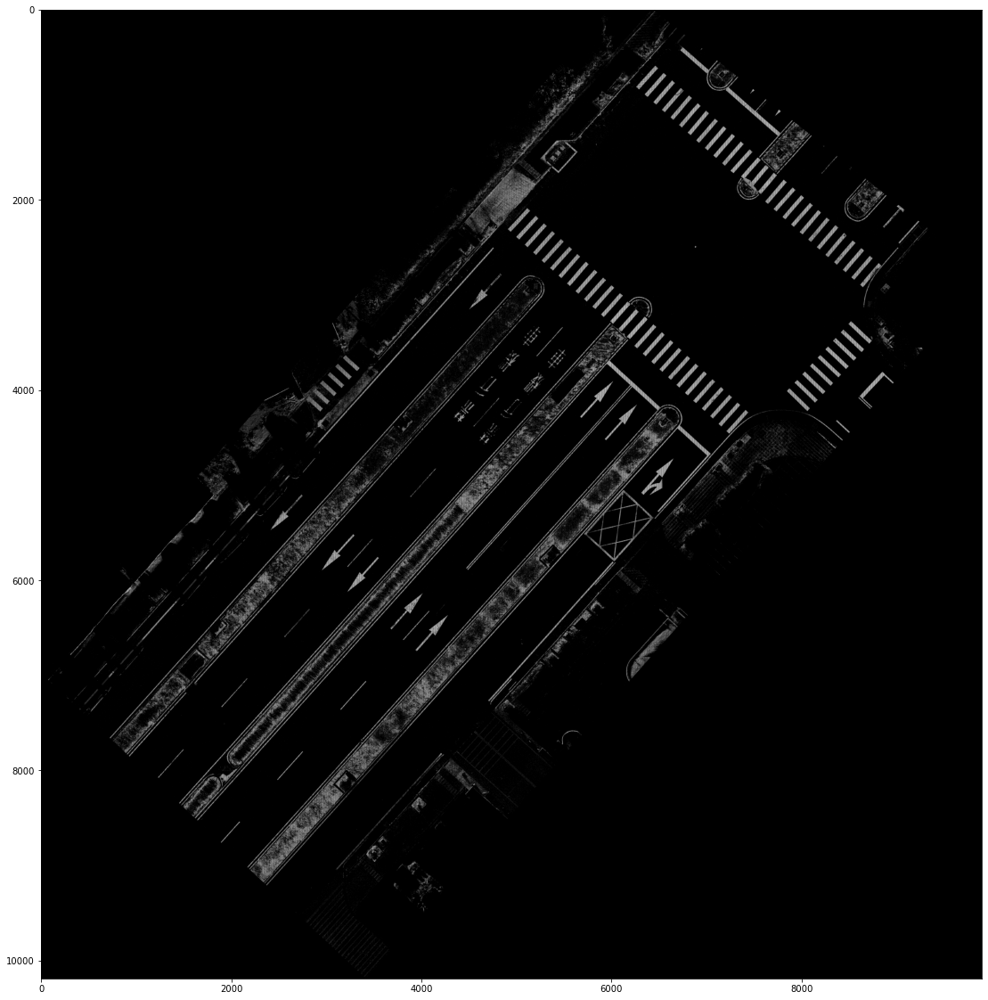

In [18]:
cv2_imshow( filterMask*raster_I/256)

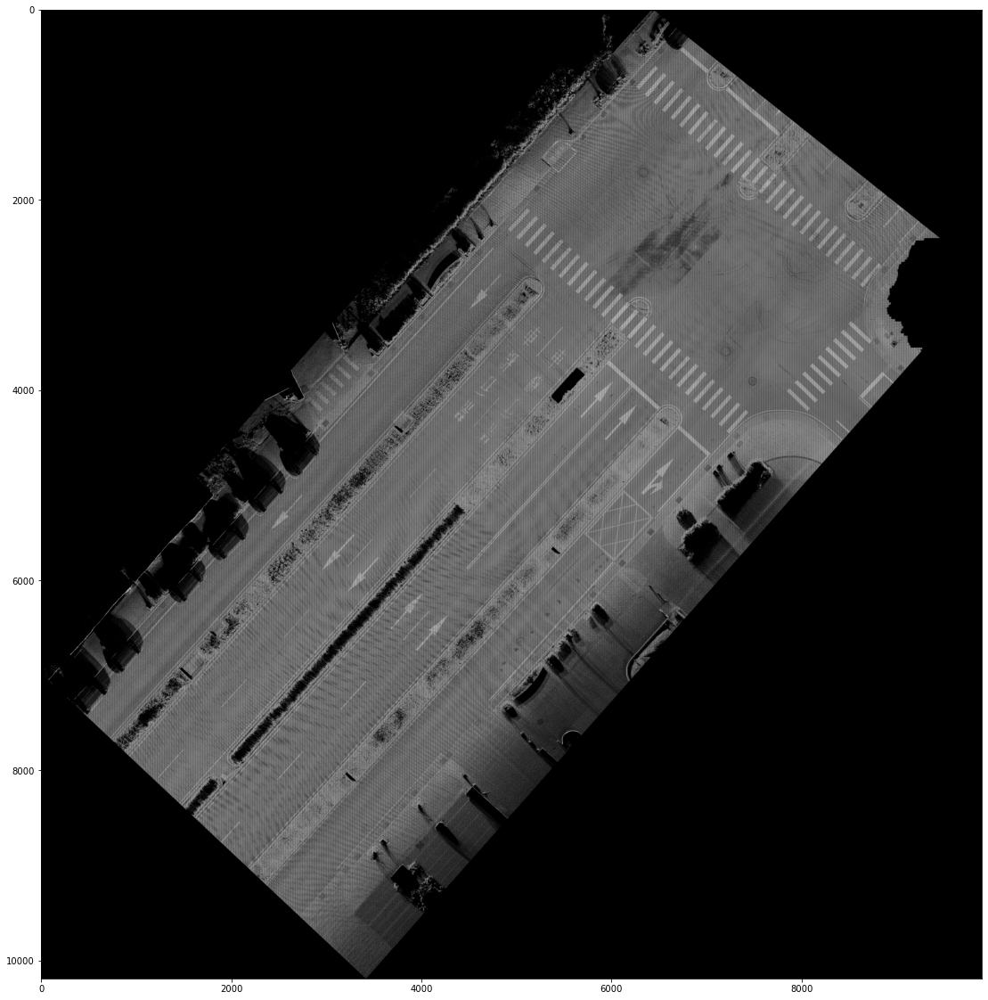

In [7]:
cv2_imshow(raster_I/256)

In [2]:
%%time
fpFolder = r"P:/HDmap/Open_Field/LiDAR/QinPu/step001_ground_filter/"
fileName = "桃園青埔_6379450200000H.las"
cpG = tl.read_las(os.path.join(fpFolder, "ground", fileName))
cpNG = tl.read_las(os.path.join(fpFolder, "non_ground", fileName))
lng_min1, lng_max1, lat_min1, lat_max1 = cpG.extent
lng_min2, lng_max2, lat_min2, lat_max2 = cpNG.extent
lat_res = lng_res = 0.01
lng_min, lng_max = np.min([lng_min1, lng_min2]), np.max([lng_max1, lng_max2])
lat_min, lat_max = np.min([lat_min1, lat_min2]), np.max([lat_max1, lat_max2])
rows = int(np.round(np.round(lat_max - lat_min, len(str(lat_res).split(".")[1]) +1)/(lat_res))) + 1
cols = int(np.round(np.round(lng_max - lng_min, len(str(lng_res).split(".")[1]) +1)/(lng_res))) + 1
cpG.build_2d_geo_ref_by_param(lng_res=0.01,lat_res=0.01, lng_min=lng_min, lat_max=lat_max, rows=rows, cols=cols)
cpNG.build_2d_geo_ref_by_param(lng_res=0.01,lat_res=0.01, lng_min=lng_min, lat_max=lat_max, rows=rows, cols=cols)

Wall time: 4min 6s


In [3]:
cpG.ref_canvas.shape, cpNG.ref_canvas.shape

((10187, 9894), (10187, 9894))

In [4]:
# %%time
# feature: should be in ['x', 'y', 'z', 'num_returns', 'return_num', 'intensity', 'classification', 'red', 'green', 'blue']
# operator: should be in ['max', 'min', 'count', 'std', 'mean', 'median', 'first', 'highest', 'majority'
raster_I = cpG.proj_to_2d_plane(feature='intensity', operator='mean', 
                               precomputed_feature=None, return_raster=True)
raster_Z = cpNG.proj_to_2d_plane(feature='z', operator='max', 
                               precomputed_feature=None, return_raster=True)
raster_D = cpG.proj_to_2d_plane(feature='intensity', operator='count', 
                               precomputed_feature=None, return_raster=True)
raster_I, raster_Z

(shape: (10187, 9894, 1)
 gdaldtype: GDT_Float64
 geo_transform: (271807.08, 0.01, 0, 2768460.7, 0, -0.01)
 projection: None
 no_data_value: None
 metadata: None,
 shape: (10187, 9894, 1)
 gdaldtype: GDT_Float64
 geo_transform: (271807.08, 0.01, 0, 2768460.7, 0, -0.01)
 projection: None
 no_data_value: None
 metadata: None)

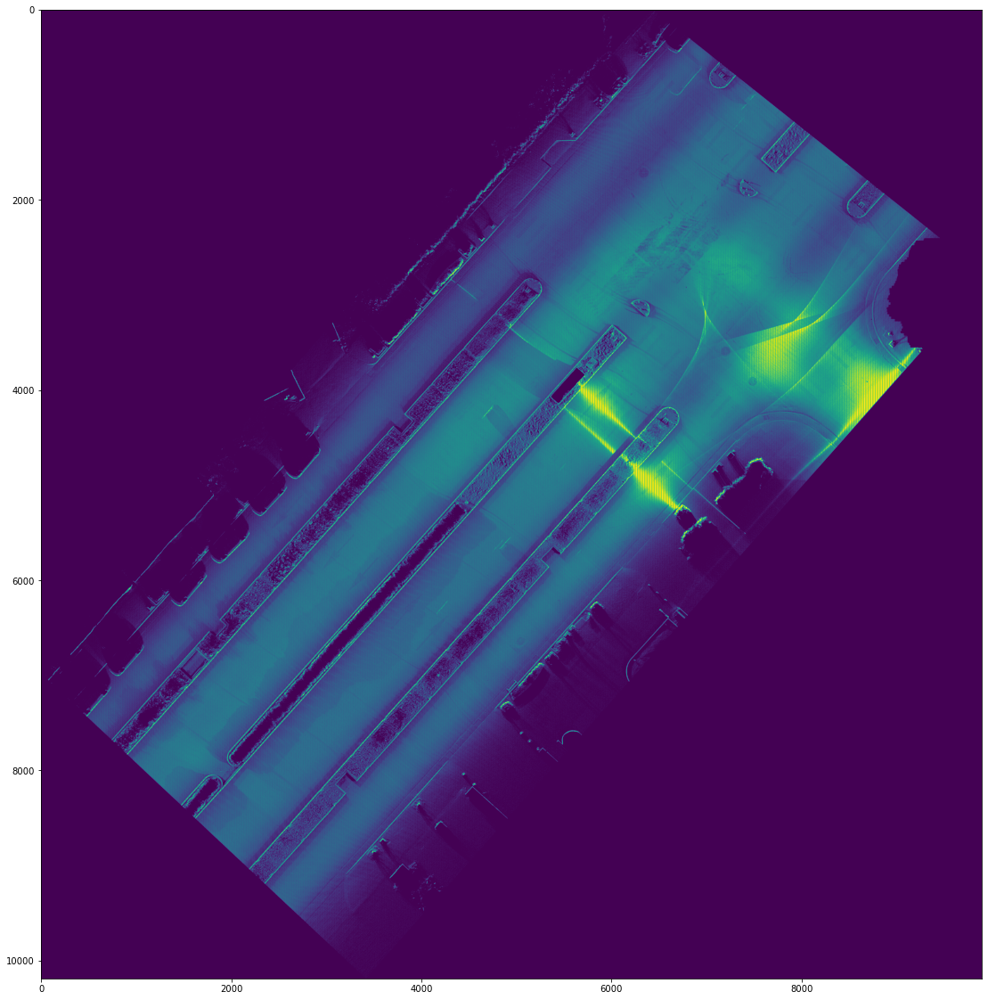

In [5]:
clipCount = tgp.Normalizer().fit_transform(raster_D.data, clip_percentage=(0.05, 0.95))
clipCount[np.isnan(clipCount)] = 0
plt.imshow(clipCount)

In [6]:
np.save("./tmp_results/raster_I.npy", raster_I.data)
cv2.imwrite("./tmp_results/raster_I.png", raster_I.data/65535*255)
np.save("./tmp_results/raster_Z.npy", raster_Z.data)
cv2.imwrite("./tmp_results/raster_Z.png", raster_Z.data)
np.save("./tmp_results/raster_D.npy", raster_D.data)
cv2.imwrite("./tmp_results/raster_D.png", clipCount*255)


True

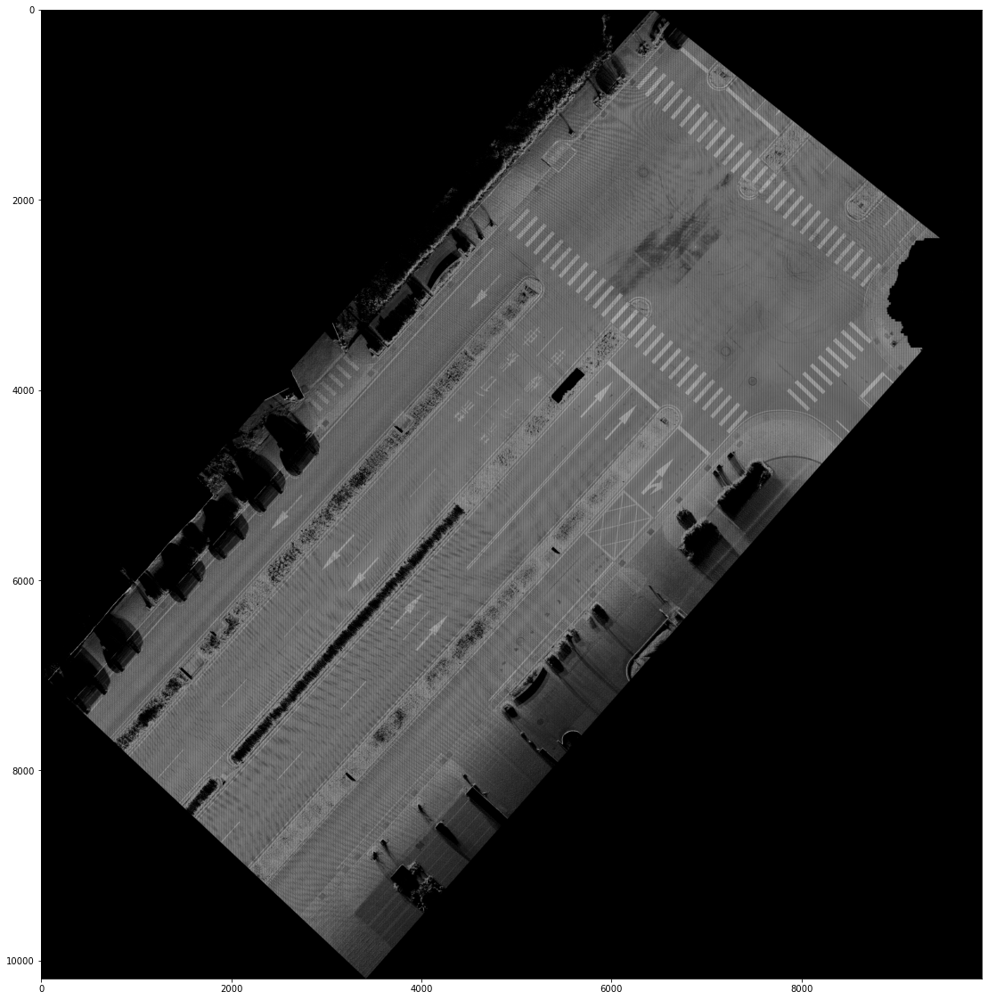

In [7]:
cv2_imshow(raster_I.data/65535*255)

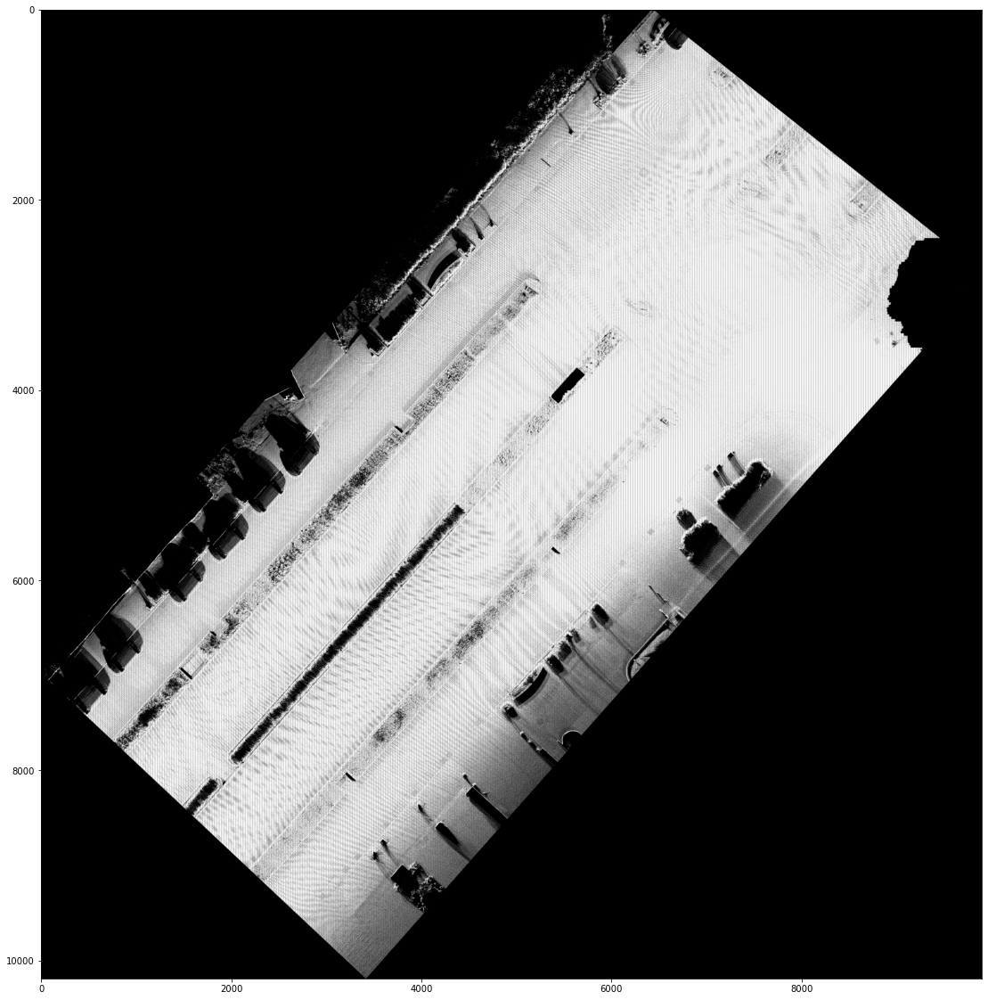

In [8]:
raster_medianBlur = cv2.medianBlur(raster_I.data.astype(np.float32), 3)
cv2_imshow(raster_medianBlur, cmap="gray")

# Step 5. Image Processing 
## 5.1.1 Median filter  (Optional)
#### Remove the salt and pepper noise
raster_medianBlur = medianBlur(raster_I.data) 

## 5.1.2 Sobel gradient calculation and boundary extraction
raster_Igradient = Sobelboundary(raster_medianBlur)

raster_Zgradient = Sobelboundary(raster_Z.data)

## 5.2 Image Thresholding using Max Entropy Segmentation (All self-adaptive)
imgZbinary = maxEntropySegmentation(raster_Z.data.astype(np.float32))

imgDbinary = maxEntropySegmentation(clipCount.astype(np.float32))
#### Use the slope and point density as the criterion
imgIgradientroad = ExtractRoadPixelIZD(imgIgradient, imgZbinary, imgDbinary)
imgIbinary = maxEntropySegMentation(imgIgradientroad);
#### However, Max Entropy Method is not efficient enough

## 5.3. Intensity Image Connected Component Analysis (CCA) and Labeling

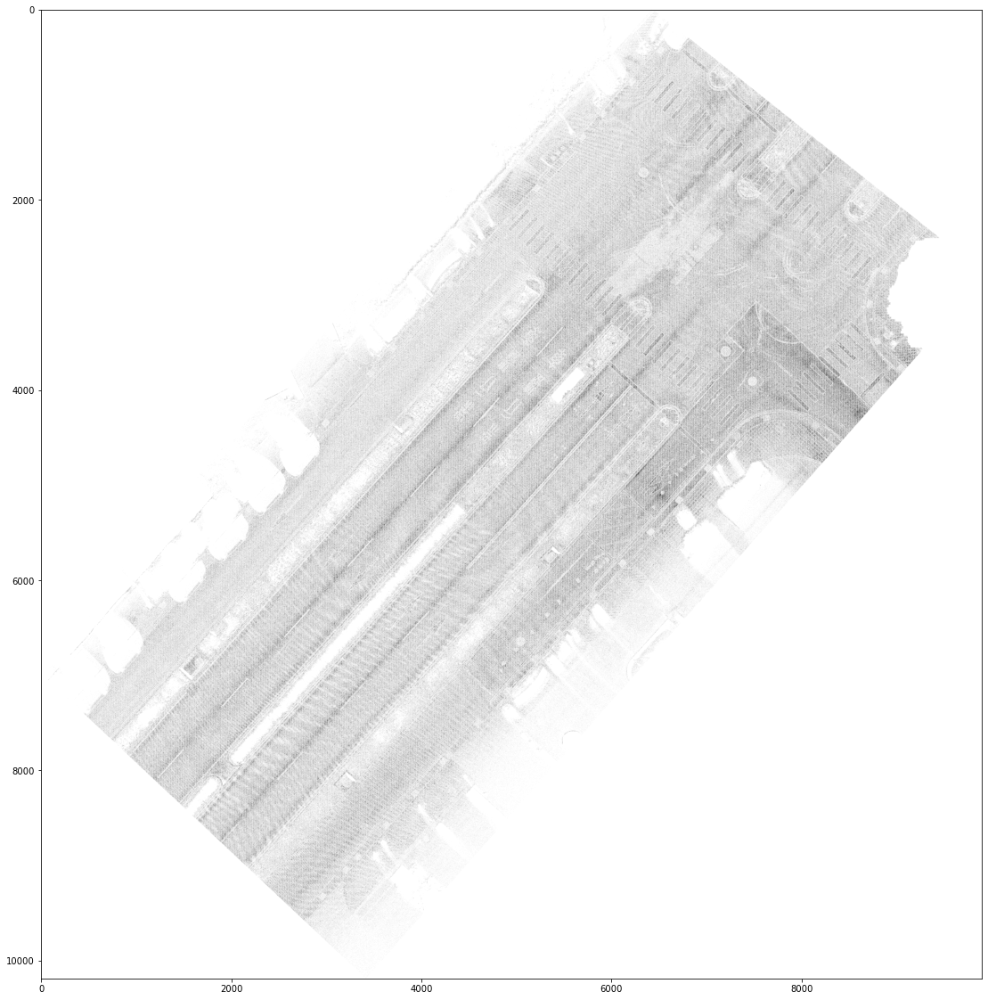

In [9]:
scale, delta, ddepth = 1, 1, cv2.CV_16S
grad_x = cv2.Sobel(raster_medianBlur, ddepth, 1, 0, 3, scale, delta, cv2.BORDER_DEFAULT)
grad_y = cv2.Sobel(raster_medianBlur, ddepth, 0, 1, 3, scale, delta, cv2.BORDER_DEFAULT)
abs_grad_x = cv2.convertScaleAbs(grad_x)
abs_grad_y = cv2.convertScaleAbs(grad_y)
raster_Igradient = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)
cv2_imshow(raster_Igradient, cmap="gray")

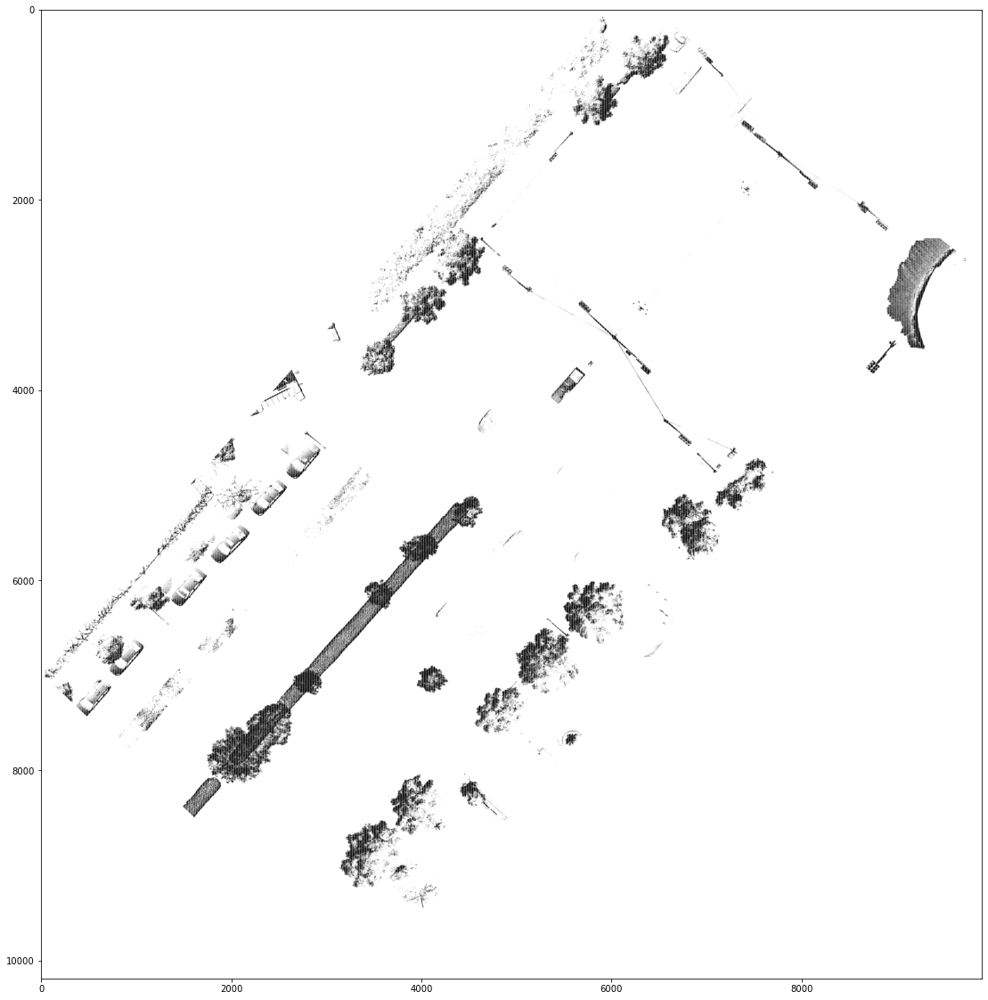

In [10]:
scale, delta, ddepth = 1, 1, cv2.CV_16S
grad_x = cv2.Sobel(raster_Z.data, ddepth, 1, 0, 3, scale, delta, cv2.BORDER_DEFAULT)
grad_y = cv2.Sobel(raster_Z.data, ddepth, 0, 1, 3, scale, delta, cv2.BORDER_DEFAULT)
abs_grad_x = cv2.convertScaleAbs(grad_x)
abs_grad_y = cv2.convertScaleAbs(grad_y)
raster_Zgradient = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)
cv2_imshow(raster_Zgradient, cmap="gray")

In [13]:
@jit
def caculateCurrentEntropy(hist, threshold):
    BackgroundSum, targetSum = 0, 0
    BackgroundEntropy, targetEntropy = 0, 0
    pDataHist = hist[0]
    for i in range(256):
        if i < threshold: BackgroundSum += pDataHist[i]
        else: targetSum += pDataHist[i]
    for i in range(256):
        if i < threshold: 
            if (pDataHist[i] == 0): continue
            ratio1 = pDataHist[i] / BackgroundSum
            BackgroundEntropy += -ratio1*np.log(ratio1)
        else:
            if (pDataHist[i] == 0): continue
            ratio2 = pDataHist[i] / targetSum
            targetEntropy += -ratio2*np.log(ratio2)
    return (targetEntropy + BackgroundEntropy)
            

def maxEntropySegmentation(inputImage):
    # Max Entropy Binarization 
    # Using the distribution of histogram to calculate the threshold leading to the max entropy.
    hist = cv2.calcHist(inputImage,[0], None, [256], (0,256))
    maxentropy, max_index = 0, 0
    for i in range(256):
        cur_entropy = caculateCurrentEntropy(hist, i)
        if (cur_entropy > maxentropy):
            maxentropy = cur_entropy
            max_index = i
    return cv2.threshold(inputImage, max_index, 1, cv2.THRESH_BINARY)

imgZbinary = maxEntropySegmentation(raster_Z.data.astype(np.float32))
imgDbinary = maxEntropySegmentation(clipCount.astype(np.float32))

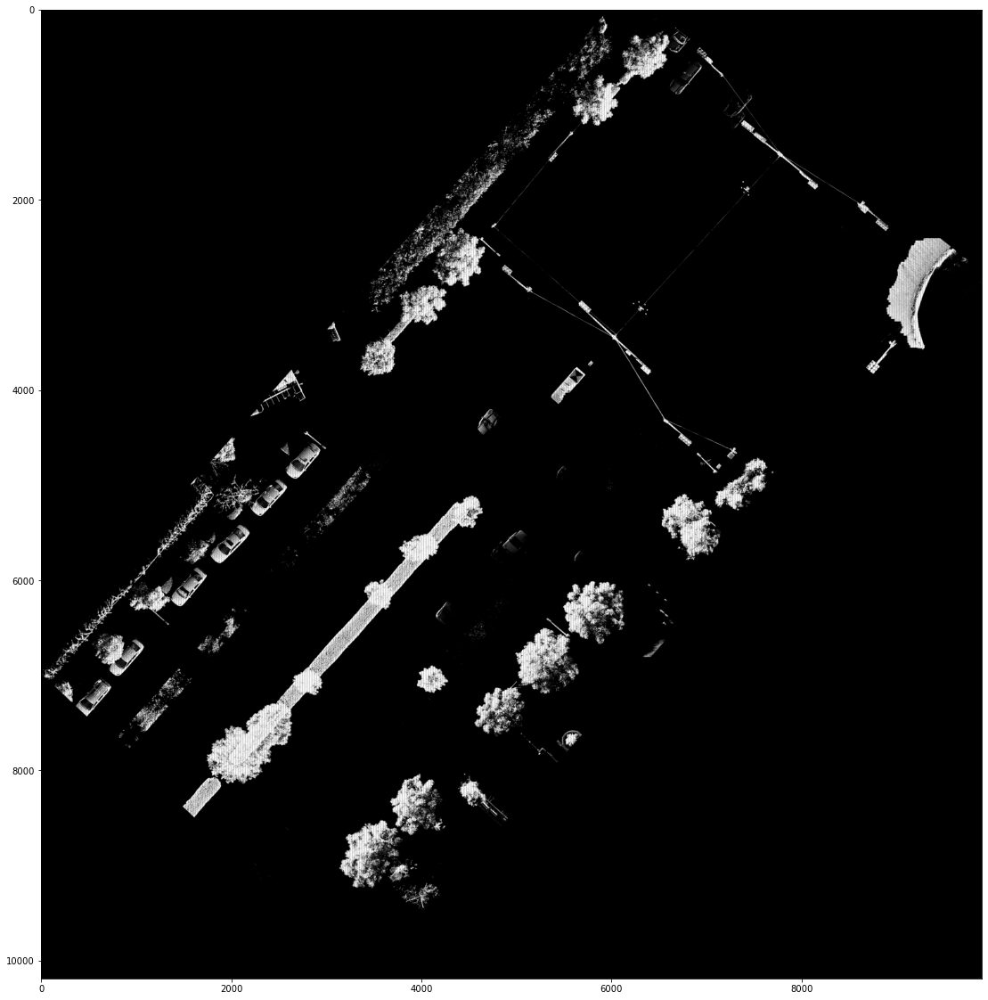

In [32]:
cv2_imshow(imgZbinary[1], cmap="gray")

In [27]:
np.unique(imgZbinary[1], return_counts=True)

(array([0., 1.], dtype=float32), array([97104311,  3685867], dtype=int64))

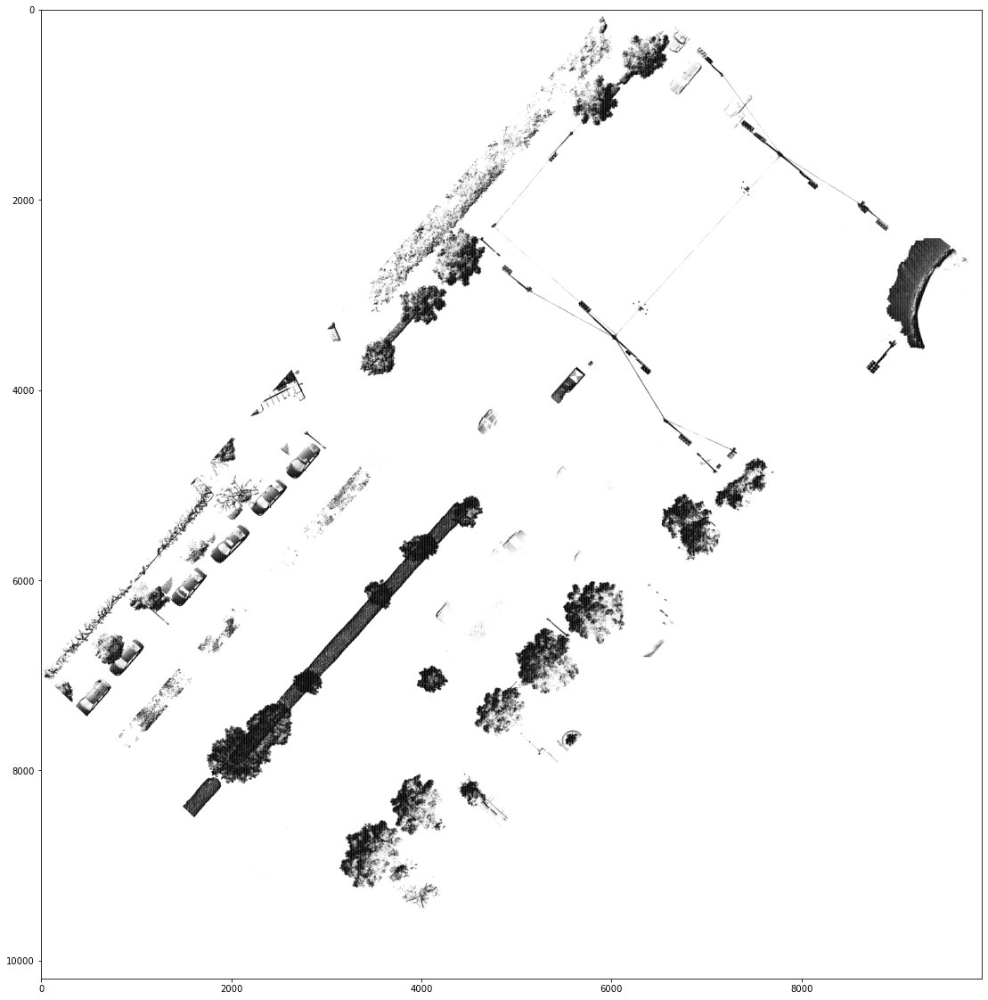

In [29]:
@jit
def ExtractRoadPixelIZD(_imgI, _binZ, _binD):
    result = np.empty_like(_imgI)
    for i in range(_imgI.shape[0]):
        for j in range(_imgI.shape[1]):
            if _binZ[i, j] == 1 :
            #if _binZ[i, j] == 1 or _binD[i, j] == 0:
                result[i, j] = 0
            else:
                result[i, j] = _imgI[i, j]
    return result

imgIgradientroad = ExtractRoadPixelIZD(raster_Igradient, imgZbinary[1], imgDbinary[1])
imgIbinary = maxEntropySegmentation(imgIgradientroad)
cv2_imshow(imgIbinary[1], cmap="gray")


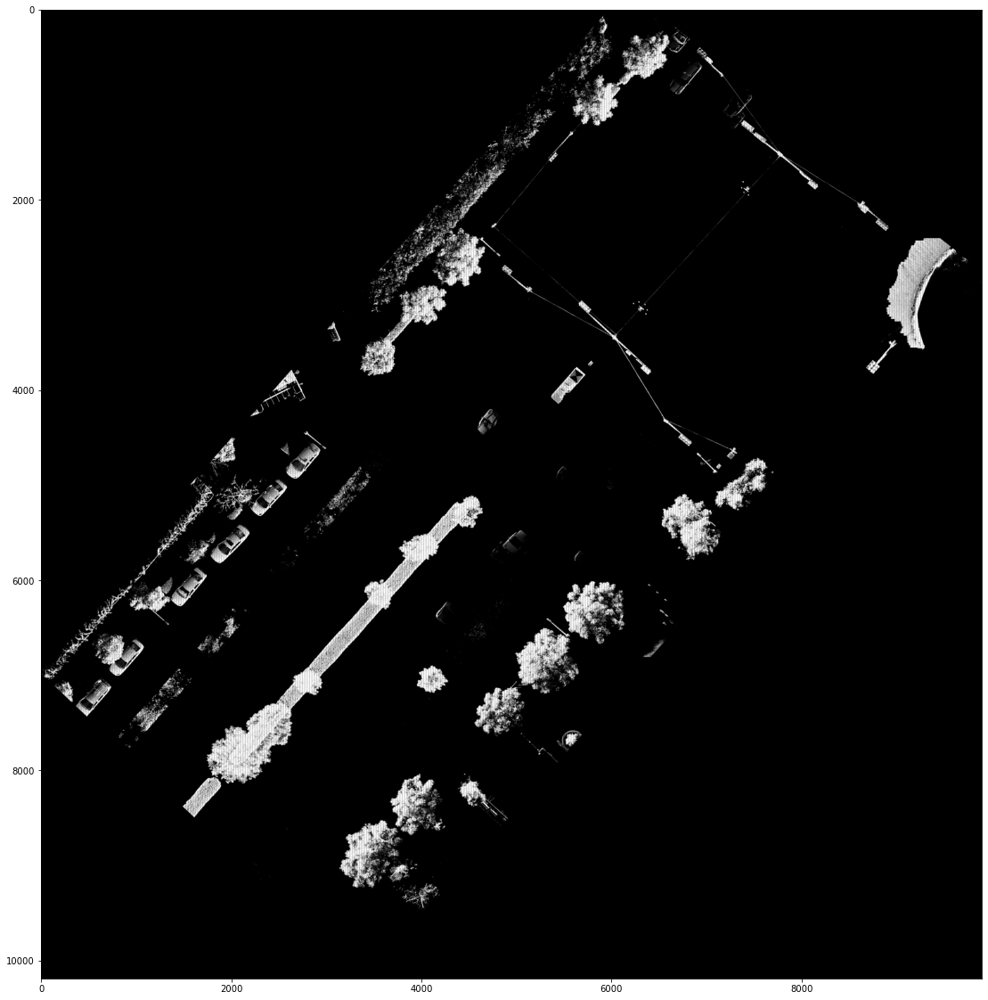

In [28]:
@jit
def ExtractRoadPixelIZD(_imgI, _binZ, _binD):
    result = np.empty_like(_imgI)
    for i in range(_imgI.shape[0]):
        for j in range(_imgI.shape[1]):
            if _binZ[i, j] == 0 :
            #if _binZ[i, j] == 1 or _binD[i, j] == 0:
                result[i, j] = 0
            else:
                result[i, j] = _imgI[i, j]
    return result

imgIgradientroad = ExtractRoadPixelIZD(raster_Igradient, imgZbinary[1], imgDbinary[1])
imgIbinary = maxEntropySegmentation(imgIgradientroad)
cv2_imshow(imgIbinary[1], cmap="gray")


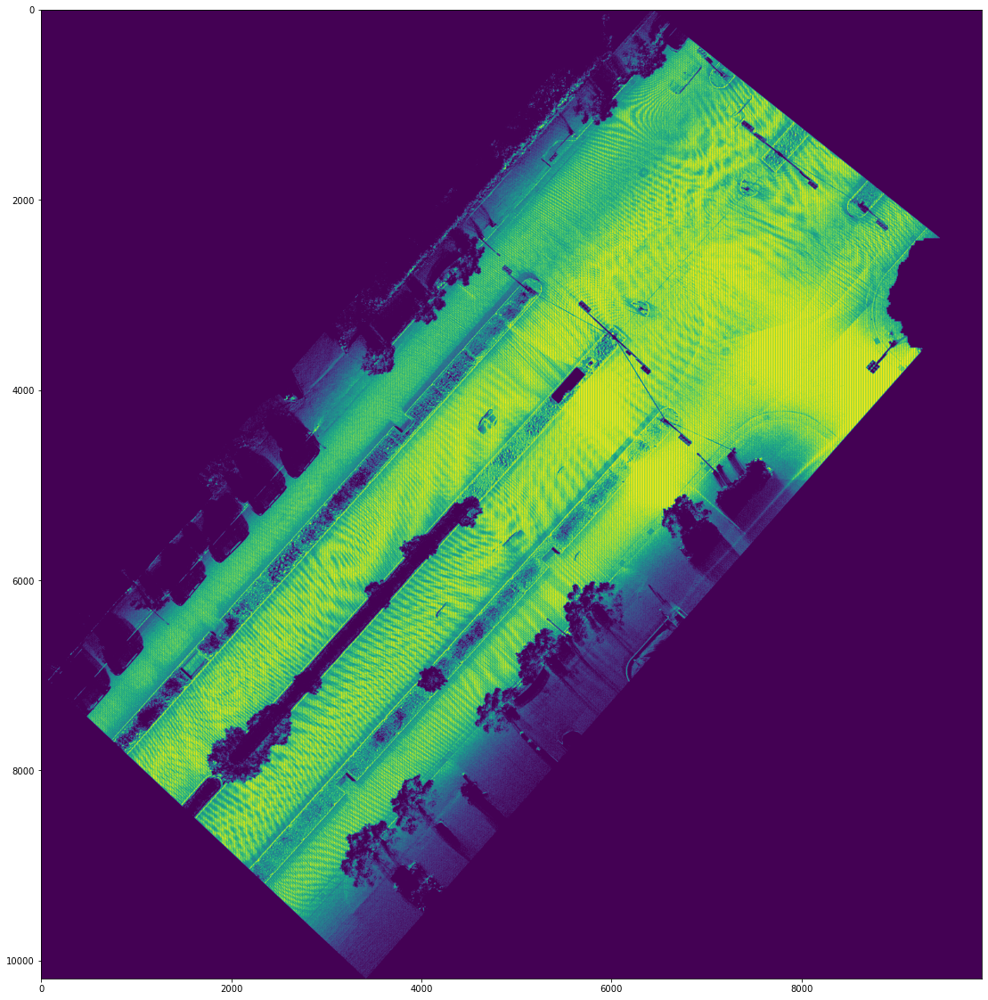

In [24]:
cv2_imshow(imgIbinary[1])


In [33]:
raster_medianBlur.shape

(10188, 9658)

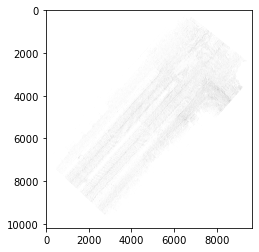

In [45]:
scale = 1
delta = 1
ddepth = cv2.CV_16S
grad_x = cv2.Sobel(raster_medianBlur, ddepth, 1, 0, ksize=3, scale=scale, delta=delta, borderType=cv2.BORDER_DEFAULT)
grad_y = cv2.Sobel(raster_medianBlur, ddepth, 0, 1, ksize=3, scale=scale, delta=delta, borderType=cv2.BORDER_DEFAULT)
abs_grad_x = cv2.convertScaleAbs(grad_x)
abs_grad_y = cv2.convertScaleAbs(grad_y)
raster_Igradient = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)
cv2_imshow(raster_Igradient, cmap="gray")

In [ ]:
sobel = sobelOperator(raster_I.data)

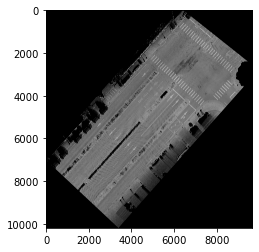

In [3]:
plt.imshow(img)